<a href="https://colab.research.google.com/github/reshmi56/ML-Projects/blob/main/FaceMask_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle

In [ ]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


Importing FaceMask Dataset

In [ ]:
#API to fetch dataset from kaggle
!kaggle datasets download -d omkargurav/face-mask-dataset

Dataset URL: https://www.kaggle.com/datasets/omkargurav/face-mask-dataset
License(s): unknown
100% 163M/163M [00:06<00:00, 30.5MB/s]
100% 163M/163M [00:06<00:00, 24.9MB/s]


In [ ]:
from zipfile import ZipFile
dataset='/content/face-mask-dataset.zip'
with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('The dataset is extracted')


The dataset is extracted


In [ ]:
!ls

data  face-mask-dataset.zip  sample_data


Importing the dependencies

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from google.colab.patches import cv2_imshow
from sklearn.model_selection import train_test_split

In [ ]:
with_mask_file=os.listdir('/content/data/with_mask')
print(with_mask_file[0:5])
print(with_mask_file[-5:])

['with_mask_1654.jpg', 'with_mask_860.jpg', 'with_mask_2922.jpg', 'with_mask_1583.jpg', 'with_mask_1553.jpg']
['with_mask_2082.jpg', 'with_mask_1678.jpg', 'with_mask_345.jpg', 'with_mask_2009.jpg', 'with_mask_3234.jpg']


In [ ]:
without_mask_file=os.listdir('/content/data/without_mask')
print(without_mask_file[0:5])
print(without_mask_file[-5:])

['without_mask_3170.jpg', 'without_mask_541.jpg', 'without_mask_1414.jpg', 'without_mask_2295.jpg', 'without_mask_3755.jpg']
['without_mask_1823.jpg', 'without_mask_2863.jpg', 'without_mask_2134.jpg', 'without_mask_772.jpg', 'without_mask_790.jpg']


In [ ]:
print('Number of with maskimages: ',len(with_mask_file))
print('Number of without maskimages: ',len(without_mask_file))

Number of with maskimages:  3725
Number of without maskimages:  3828


Now create labels for two class of images
With mask-->1
Without mask--->0

In [ ]:
#create labels
with_mask_labels=[1]*3725
without_mask_labels=[0]*3828

In [ ]:
print(with_mask_labels[0:5])
print(without_mask_labels[0:5])

[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


In [ ]:
labels=with_mask_labels+without_mask_labels
print(len(labels))
print(labels[0:5])
print(labels[-5:])

7553
[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


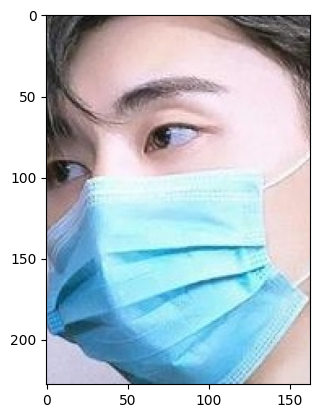

In [ ]:
#displaying with mask image
img=mpimg.imread('/content/data/with_mask/with_mask_1545.jpg')
imgplot=plt.imshow(img)
plt.show()

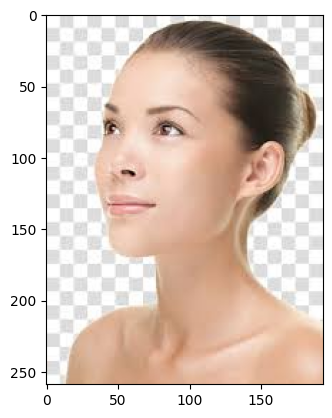

In [ ]:
#displaying without maskimage
img=mpimg.imread('/content/data/without_mask/without_mask_2925.jpg')
imgplot=plt.imshow(img)
plt.show()

Image Processing
1)Resize the images
2)Convert images to numpy array

In [ ]:
# convert images to numpy arrays+

with_mask_path = '/content/data/with_mask/'

data = []

for img_file in with_mask_file:

  image = Image.open(with_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)



without_mask_path = '/content/data/without_mask/'


for img_file in without_mask_file:

  image = Image.open(without_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
type(data)

list

In [ ]:
len(data)

7553

array([[[33, 30, 39],
        [33, 30, 39],
        [33, 32, 39],
        ...,
        [15, 16, 21],
        [19, 20, 25],
        [22, 23, 28]],

       [[32, 29, 38],
        [31, 27, 37],
        [28, 26, 33],
        ...,
        [13, 14, 19],
        [17, 18, 22],
        [18, 19, 24]],

       [[32, 29, 38],
        [28, 25, 34],
        [23, 22, 29],
        ...,
        [13, 14, 18],
        [14, 15, 19],
        [15, 16, 21]],

       ...,

       [[19, 19, 19],
        [14, 14, 14],
        [17, 17, 17],
        ...,
        [56, 51, 48],
        [85, 81, 78],
        [95, 92, 91]],

       [[20, 20, 20],
        [13, 13, 13],
        [12, 12, 12],
        ...,
        [44, 39, 36],
        [72, 67, 64],
        [99, 95, 94]],

       [[21, 21, 21],
        [15, 15, 15],
        [12, 12, 12],
        ...,
        [37, 32, 29],
        [67, 62, 59],
        [94, 90, 89]]], dtype=uint8)
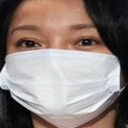

In [ ]:
data[0]

In [ ]:
type(data[0])

numpy.ndarray

In [ ]:
#converting images and label list to numpy
X=np.array(data)
Y=np.array(labels)

In [ ]:
type(X)
type(Y)

numpy.ndarray

In [ ]:
print(X.shape)

(7553, 128, 128, 3)


In [ ]:
print(Y.shape)

(7553,)


In [ ]:
print(Y)

[1 1 1 ... 0 0 0]


Train Test Split

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=2)

In [ ]:
print(X.shape,X_train.shape,X_test.shape)

(7553, 128, 128, 3) (6042, 128, 128, 3) (1511, 128, 128, 3)


Scaling the data

In [ ]:
X_train_scaled=X_train/255
X_test_scaled=X_test/255

array([[[205, 205, 205],
        [209, 209, 209],
        [221, 221, 221],
        ...,
        [213, 210, 213],
        [214, 206, 207],
        [216, 208, 208]],

       [[208, 208, 208],
        [172, 172, 172],
        [129, 129, 129],
        ...,
        [152, 171, 174],
        [180, 195, 195],
        [208, 211, 210]],

       [[215, 215, 215],
        [121, 121, 121],
        [  0,   0,   0],
        ...,
        [ 84, 115, 122],
        [151, 178, 183],
        [203, 213, 215]],

       ...,

       [[ 28,  14,  16],
        [ 23,  13,  14],
        [ 12,   7,   7],
        ...,
        [ 92,  95,   9],
        [166, 163, 111],
        [216, 211, 203]],

       [[ 27,  14,  17],
        [ 32,  22,  24],
        [ 28,  22,  22],
        ...,
        [169, 167, 113],
        [200, 193, 172],
        [214, 209, 215]],

       [[ 25,  14,  15],
        [ 41,  32,  30],
        [ 44,  35,  31],
        ...,
        [216, 212, 203],
        [212, 206, 213],
        [210, 206, 217]]], dtype=uint8)
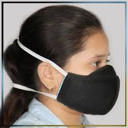

In [ ]:
X_train[0]

In [ ]:
X_train_scaled[0]

array([[[0.80392157, 0.80392157, 0.80392157],
        [0.81960784, 0.81960784, 0.81960784],
        [0.86666667, 0.86666667, 0.86666667],
        ...,
        [0.83529412, 0.82352941, 0.83529412],
        [0.83921569, 0.80784314, 0.81176471],
        [0.84705882, 0.81568627, 0.81568627]],

       [[0.81568627, 0.81568627, 0.81568627],
        [0.6745098 , 0.6745098 , 0.6745098 ],
        [0.50588235, 0.50588235, 0.50588235],
        ...,
        [0.59607843, 0.67058824, 0.68235294],
        [0.70588235, 0.76470588, 0.76470588],
        [0.81568627, 0.82745098, 0.82352941]],

       [[0.84313725, 0.84313725, 0.84313725],
        [0.4745098 , 0.4745098 , 0.4745098 ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.32941176, 0.45098039, 0.47843137],
        [0.59215686, 0.69803922, 0.71764706],
        [0.79607843, 0.83529412, 0.84313725]],

       ...,

       [[0.10980392, 0.05490196, 0.0627451 ],
        [0.09019608, 0.05098039, 0.05490196],
        [0.04705882, 0

Building Convolution Neural Network(CNN)

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
num_of_classes=2
model=keras.Sequential()
#scan the input image or feature map to extract features like edges, textures, and patterns-kernel_size
#to reduce spatial dimensions (height ,width) of input feature maps while retaining important information-Pooling
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),activation='relu',input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Conv2D(64,kernel_size=(3,3),activation='relu'))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(128,activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(64,activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(num_of_classes,activation='softmax'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Compile the model

In [ ]:
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['acc'])
# gradient descent algorithm adapts learning rates for each parameter based on  first and second moments of the gradients-adam
#loss function for multi-class classification tasks where target labels are integers,efficient in handling large numbers of classes-sparse

Training the neural network

In [ ]:
history=model.fit(X_train_scaled,Y_train,validation_split=0.1,epochs=5)

Epoch 1/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 144s 827ms/step - acc: 0.7420 - loss: 0.7311 - val_acc: 0.8826 - val_loss: 0.3019
Epoch 2/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 144s 842ms/step - acc: 0.8948 - loss: 0.2869 - val_acc: 0.9025 - val_loss: 0.2146
Epoch 3/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 199s 825ms/step - acc: 0.9126 - loss: 0.2272 - val_acc: 0.9157 - val_loss: 0.2403
Epoch 4/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 142s 827ms/step - acc: 0.9214 - loss: 0.2060 - val_acc: 0.9289 - val_loss: 0.2503
Epoch 5/5
170/170 ━━━━━━━━━━━━━━━━━━━━ 141s 831ms/step - acc: 0.9457 - loss: 0.1364 - val_acc: 0.9273 - val_loss: 0.2388


Model Evaluation

In [ ]:
loss,accuracy=model.evaluate(X_test_scaled,Y_test)
print('Test Accuracy= ',accuracy)

48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 212ms/step - acc: 0.9301 - loss: 0.2020
Test Accuracy=  0.9291859865188599


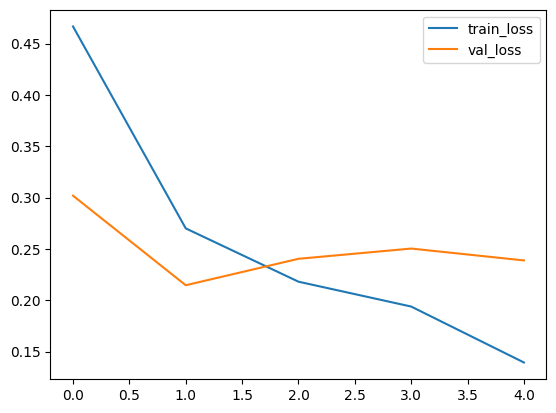

In [ ]:
h=history
#plot the loss value
plt.plot(h.history['loss'],label='train_loss')
plt.plot(h.history['val_loss'],label='val_loss')
plt.legend()
plt.show()

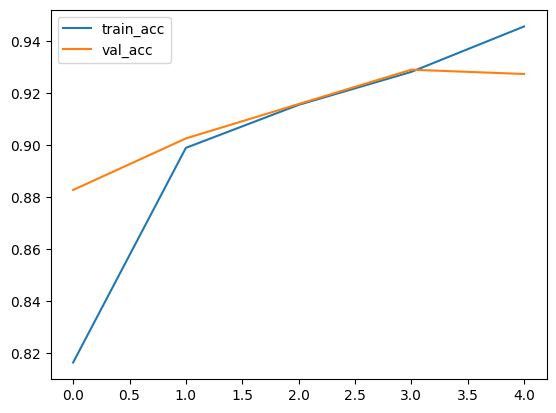

In [ ]:
#plot accuracy value
plt.plot(h.history['acc'],label='train_acc')
plt.plot(h.history['val_acc'],label='val_acc')
plt.legend()
plt.show()

Predictive System

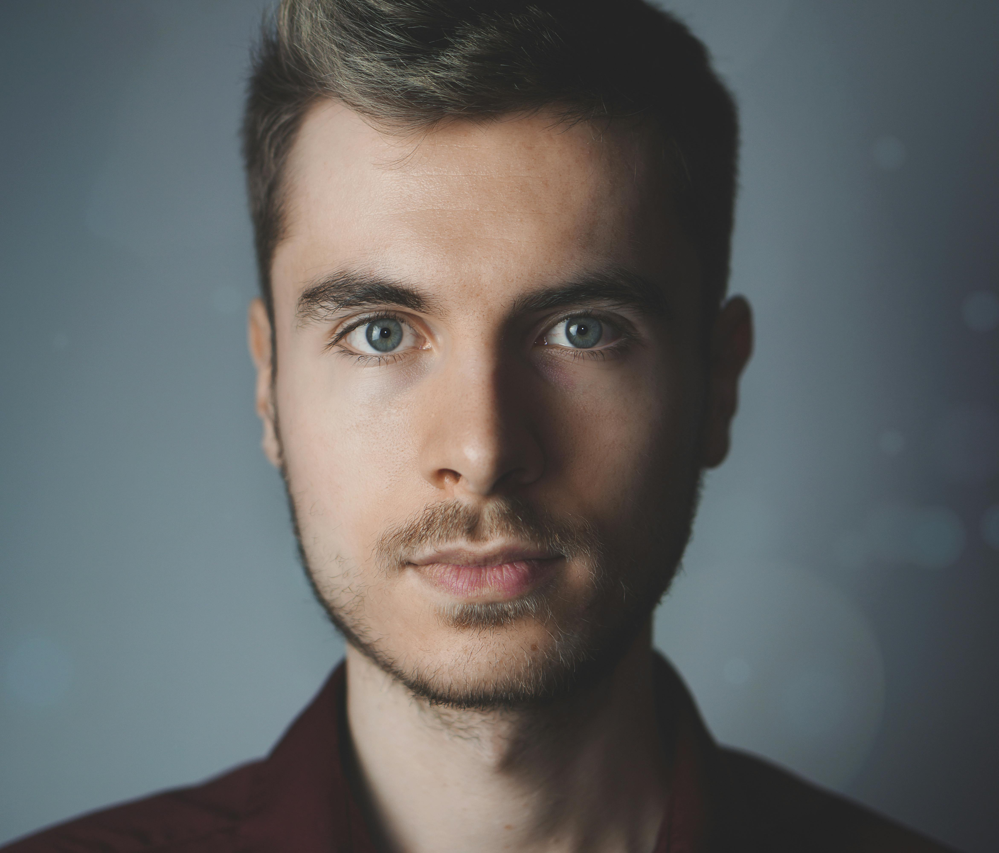

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
[[0.44084463 0.55915534]]
1
The person is not wearing mask


In [ ]:
input_image_path=input('Path of image to be predicted: ')
import cv2
input_image=cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized=cv2.resize(input_image,(128,128))

input_image_scaled=input_image_resized/255

input_image_reshaped=np.reshape(input_image_scaled,[1,128,128,3])

input_prediction=model.predict(input_image_reshaped)

print(input_prediction)

input_pred_label=np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label==0:
  print('The preson in image wearing mask')
else:
  print('The person is not wearing mask')



